In [381]:
import pandas as pd
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import random
import os

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

import warnings
warnings.filterwarnings('ignore')

sns.set_style()

# path to data folder
# PATH = r'C:\Users\Никита\Андан\Project\data'
PATH = r"/Users/andrewnizov/Desktop/АнДан/Проект"

# Content

This notebook contains analysis of stock prices in chosen sectors and testing hypotheses.
1) Исследование наличия сезонности

    а) визуальный анализ через графики для всех секторов по конкретным акциям
    
    б) exponential smoothing, чтобы понять, какие акции потенциально имеют сезонность (для всех секторов)
    
    в) ДЛЯ ТЕХ, КТО ПОТЕНЦИАЛЬНО ИМЕЕТ
    
    г) график автокорреляции и seasonal_decompose
    
2) Исследование корреляции индексов IMOEX и S&P500 с ценами акций для всех секторов
3) Корреляционная матрица между индексами и ценами акций для всех секторов - СДЕЛАНО (проверить выводы)
4) Диаграммы рассеяния для USDRUB и цен акций для всех секторов + общая корреляционная матрица для курсов драг металлов и usdrub - В ПРОЦЕССЕ
5) Цены акций и драг металлы для всех секторов - СДЕЛАНО


## План

* Вывести графики цен/объемов торгов для акций по разным временным периодам (месяц, год, 4 месяца), чтобы выявить сезонность и какие-нибудь закономерности.
* Графики для исследования корреляции индексов IMOEX и S&P500 с ценами акций.
* Корреляционная матрица между индексами и ценами акций.
* Диаграммы рассеяния для `usdrub` и цен акций российских компаний.
* Скользящие средние цен акций: Постройте графики с добавлением скользящих средних (например, 20-дневных и 50-дневных) для сглаживания краткосрочных колебаний и выявления долгосрочных трендов.
* Гистограммы для дневных изменений цен акций, чтобы понять их распределение и волатильность.
* Графики KDE для gold/silver/platinum/palladium_rates, чтобы понять их распределение.
* Разложите временные ряды цен акций на тренд, сезонность и остаток. Это поможет лучше понять составляющие временного ряда.
* Графики зависимостей цен акций от драгоценных металлов (gold/silver/platinum/palladium_rates).

* для **Exponential smoothing:** from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
* экспоненциальное сглаживание и SSA сразу выделяют тренд и сезонность

In [2]:
"""fintech = pd.read_csv(os.path.join(PATH, r'final_datasets/final_fintech.csv'))
fintech['date'] = pd.to_datetime(fintech['date'])
ticker_names = os.listdir(os.path.join(PATH, r'fintech'))"""

"fintech = pd.read_csv(os.path.join(PATH, r'final_datasets/final_fintech.csv'))\nfintech['date'] = pd.to_datetime(fintech['date'])\nticker_names = os.listdir(os.path.join(PATH, r'fintech'))"

In [315]:
fintech = pd.read_csv('final_fintech.csv')
industrial_goods = pd.read_csv('final_industrial_goods.csv')
renewable_energy = pd.read_csv('final_renewable_energy.csv')
healthcare_services = pd.read_csv('final_healthcare_services.csv')

fintech['date'] = pd.to_datetime(fintech['date'])
industrial_goods['date'] = pd.to_datetime(industrial_goods['date'])
renewable_energy['date'] = pd.to_datetime(renewable_energy['date'])
healthcare_services['date'] = pd.to_datetime(healthcare_services['date'])

# Исследование сезонности

## Fintech (визуальный анализ)
попытка оценить сектор в целом

In [447]:
ru_ticker_names_close_fintech = [ticker for ticker in fintech.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_fintech = [ticker for ticker in fintech.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_fintech = [ticker for ticker in fintech.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_fintech = [ticker for ticker in fintech.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [448]:
# Агрегируем данные о финансовых показателях компаний 
# с временным интервалом в один месяц и один квартал, а затем извлечем 
# данные о ценах закрытия и объемов торгов для российских и американских компаний.
fintech_monthly = fintech.resample('M', on='date').mean(numeric_only=True)

ru_fintech_monthly_close = fintech_monthly[ru_ticker_names_close_fintech]
ru_fintech_monthly_volume = fintech_monthly[ru_ticker_names_volume_fintech]
usa_fintech_monthly_close = fintech_monthly[usa_ticker_names_close_fintech]
usa_fintech_monthly_volume = fintech_monthly[usa_ticker_names_volume_fintech]

Для примера и наглядности выведем графики по 5ти случайным акциям российских и американских компаний финтех сектора.

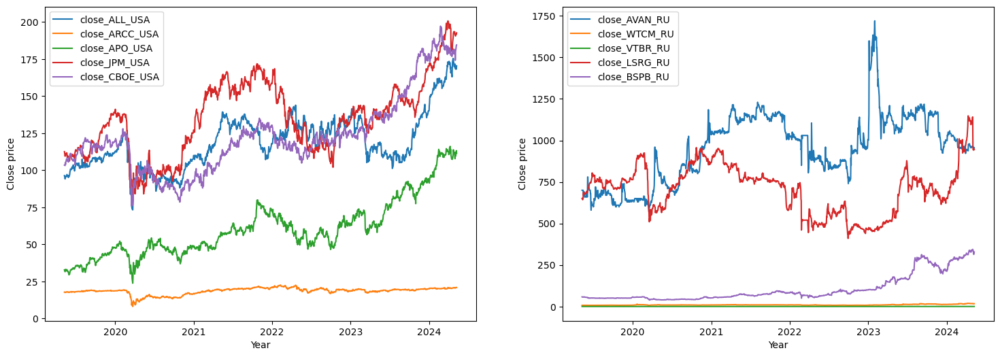

In [389]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_fintech = random.sample(usa_ticker_names_close_fintech, 5)
random.seed(2)
RU_price_samples_fintech = random.sample(ru_ticker_names_close_fintech, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_fintech:
    sns.lineplot(fintech, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].legend();
    
for RU_share_price in RU_price_samples_fintech:
    sns.lineplot(fintech, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].legend();

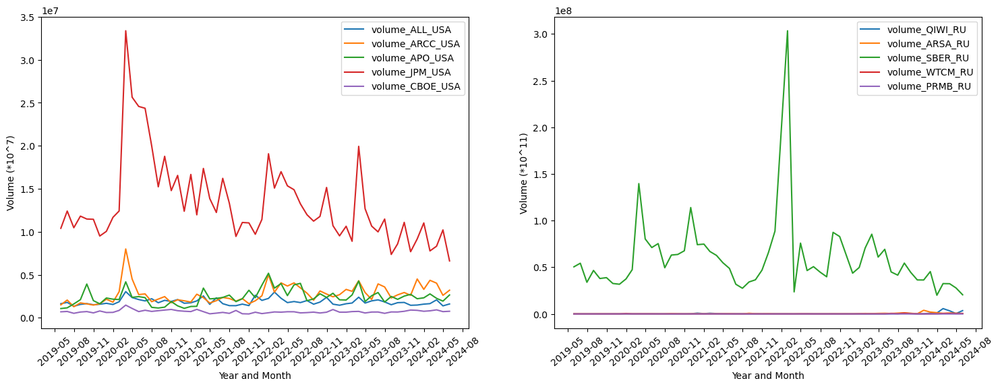

In [404]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_fintech = random.sample(list(usa_fintech_monthly_volume.columns), 5)
random.seed(52)
RU_monthly_volume_samples_fintech = random.sample(list(ru_fintech_monthly_volume.columns), 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_fintech:
    sns.lineplot(fintech_monthly, x = fintech_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
    # воспользуемся mdates из MatplotLib, чтобы корректно подписать значения на оси абсцисс
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in RU_monthly_volume_samples_fintech:
    sns.lineplot(fintech_monthly, x = fintech_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

**Выводы:** можно заметить, что преимущественно с февраля (%m=02) по май (%m=05) цены снижаются, а объем торгов увеличивается. Однако, на основе данных графиках сложно убедиться, что это так и выделить какую-то еще сезонность. Поэтому надо воспользоваться более продвинутой моделью для временных рядов.

## Renewable energy (визуальный анализ)
попытка оценить сектор в целом

re = renewable energy

In [405]:
ru_ticker_names_close_re = [ticker for ticker in renewable_energy.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_re = [ticker for ticker in renewable_energy.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_re = [ticker for ticker in renewable_energy.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_re = [ticker for ticker in renewable_energy.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [406]:
# Агрегируем данные о финансовых показателях компаний 
# с временным интервалом в один месяц и один квартал, а затем извлечем 
# данные о ценах закрытия и объемов торгов для российских и американских компаний.
re_monthly = renewable_energy.resample('M', on='date').mean(numeric_only=True)

ru_re_monthly_close = re_monthly[ru_ticker_names_close_re]
ru_re_monthly_volume = re_monthly[ru_ticker_names_volume_re]
usa_re_monthly_close = re_monthly[usa_ticker_names_close_re]
usa_re_monthly_volume = re_monthly[usa_ticker_names_volume_re]

Для примера и наглядности выведем графики по 5ти случайным акциям российских и американских компаний сектора возобновляемой энергии.

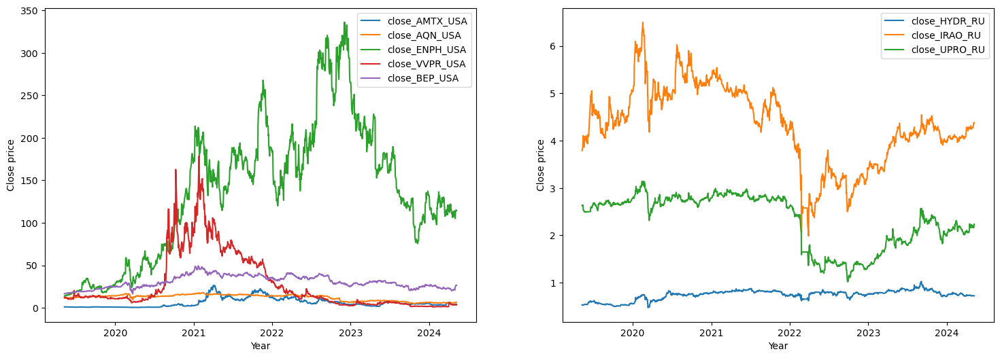

In [409]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_re = random.sample(usa_ticker_names_close_re, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_re:
    sns.lineplot(renewable_energy, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].legend();
    
for RU_share_price in ru_ticker_names_close_re:
    sns.lineplot(renewable_energy, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].legend();

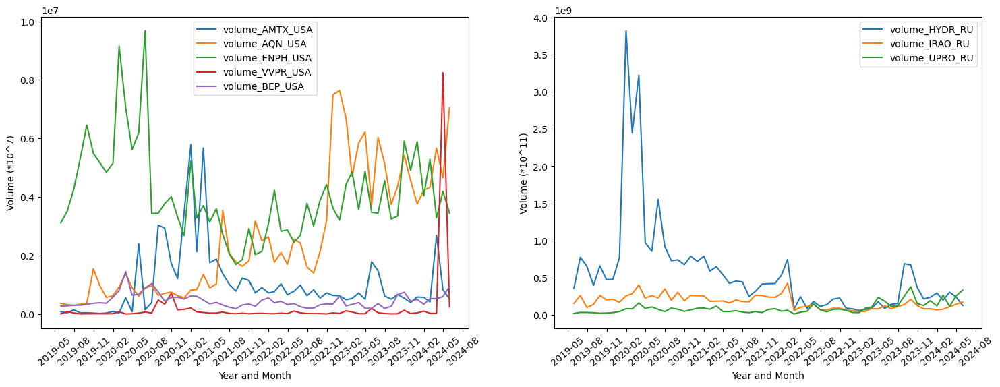

In [410]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_re = random.sample(usa_ticker_names_volume_re, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_re:
    sns.lineplot(re_monthly, x = re_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
    # воспользуемся mdates из MatplotLib, чтобы корректно подписать значения на оси абсцисс
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in ru_ticker_names_volume_re:
    sns.lineplot(re_monthly, x = re_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

## Industrial goods (визуальный анализ)
попытка оценить сектор в целом

ig = industrial_goods

In [463]:
ru_ticker_names_close_ig = [ticker for ticker in industrial_goods.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_ig = [ticker for ticker in industrial_goods.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_ig = [ticker for ticker in industrial_goods.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_ig = [ticker for ticker in industrial_goods.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [414]:
# Агрегируем данные о финансовых показателях компаний 
# с временным интервалом в один месяц и один квартал, а затем извлечем 
# данные о ценах закрытия и объемов торгов для российских и американских компаний.
ig_monthly = industrial_goods.resample('M', on='date').mean(numeric_only=True)

ru_ig_monthly_close = ig_monthly[ru_ticker_names_close_ig]
ru_ig_monthly_volume = ig_monthly[ru_ticker_names_volume_ig]
usa_ig_monthly_close = ig_monthly[usa_ticker_names_close_ig]
usa_ig_monthly_volume = ig_monthly[usa_ticker_names_volume_ig]

Для примера и наглядности выведем графики по 5ти случайным акциям российских и американских компаний финтех сектора.

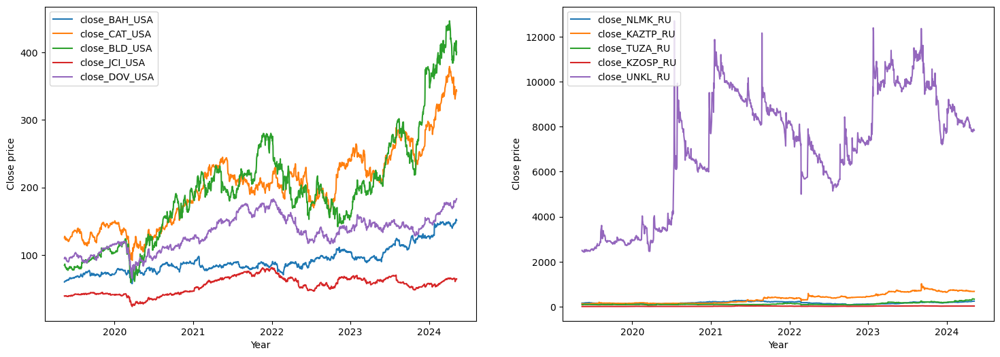

In [424]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_ig = random.sample(usa_ticker_names_close_ig, 5)
random.seed(5)
RU_price_samples_ig = random.sample(ru_ticker_names_close_ig, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_ig:
    sns.lineplot(industrial_goods, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].legend();
    
for RU_share_price in RU_price_samples_ig:
    sns.lineplot(industrial_goods, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].legend();

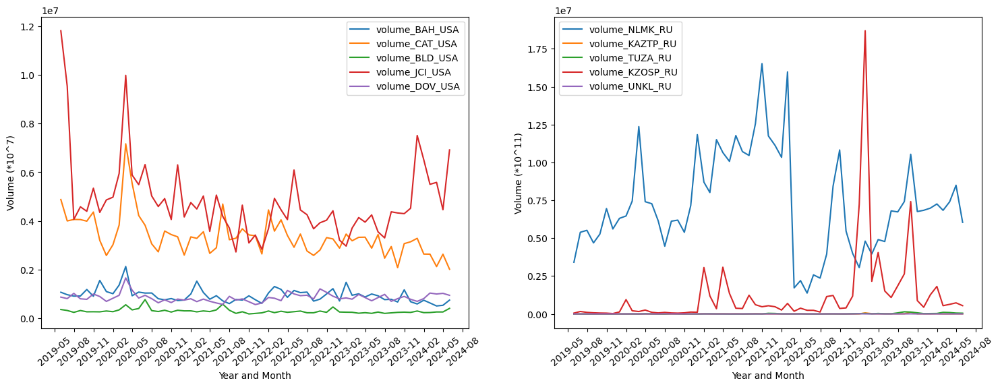

In [425]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_ig = random.sample(list(usa_ig_monthly_volume.columns), 5)
random.seed(5)
RU_monthly_volume_samples_ig = random.sample(list(ru_ig_monthly_volume.columns), 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_ig:
    sns.lineplot(ig_monthly, x = ig_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
    # воспользуемся mdates из MatplotLib, чтобы корректно подписать значения на оси абсцисс
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in RU_monthly_volume_samples_ig:
    sns.lineplot(ig_monthly, x = ig_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

## Healthcare services (визуальный анализ)
попытка оценить сектор в целом

hs = healthcare services

In [427]:
ru_ticker_names_close_hs = [ticker for ticker in healthcare_services.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_hs = [ticker for ticker in healthcare_services.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_hs = [ticker for ticker in healthcare_services.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_hs = [ticker for ticker in healthcare_services.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [428]:
# Агрегируем данные о финансовых показателях компаний 
# с временным интервалом в один месяц и один квартал, а затем извлечем 
# данные о ценах закрытия и объемов торгов для российских и американских компаний.
hs_monthly = healthcare_services.resample('M', on='date').mean(numeric_only=True)

ru_hs_monthly_close = hs_monthly[ru_ticker_names_close_hs]
ru_hs_monthly_volume = hs_monthly[ru_ticker_names_volume_hs]
usa_hs_monthly_close = hs_monthly[usa_ticker_names_close_hs]
usa_hs_monthly_volume = hs_monthly[usa_ticker_names_volume_hs]

Для примера и наглядности выведем графики по 5ти случайным акциям российских и американских компаний финтех сектора.

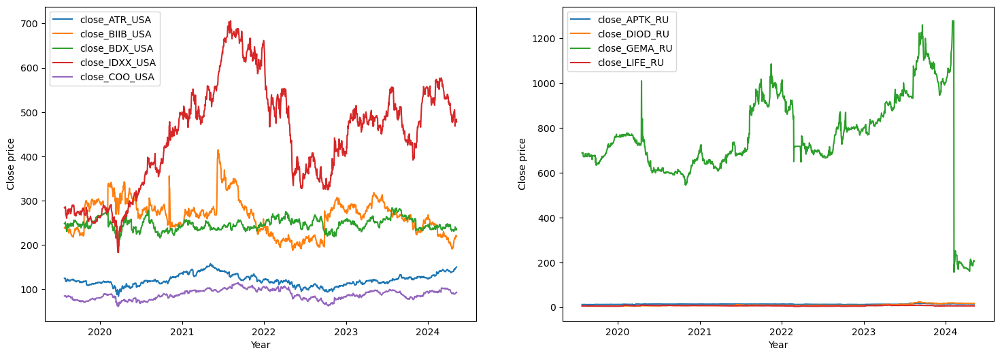

In [431]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_hs = random.sample(usa_ticker_names_close_hs, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_hs:
    sns.lineplot(healthcare_services, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].legend();
    
for RU_share_price in ru_ticker_names_close_hs:
    sns.lineplot(healthcare_services, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].legend();

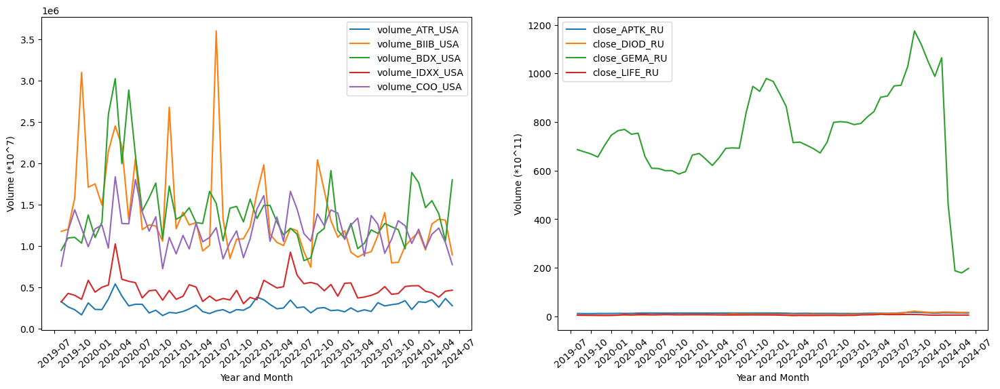

In [434]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_hs = random.sample(list(usa_hs_monthly_volume.columns), 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_hs:
    sns.lineplot(hs_monthly, x = hs_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
    # воспользуемся mdates из MatplotLib, чтобы корректно подписать значения на оси абсцисс
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in ru_ticker_names_close_hs:
    sns.lineplot(hs_monthly, x = hs_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

**Вывод:** по визуальному анализу не удалось выявить какой-либо четкой сезонности. Обратимся к более продвинутым методам, чтобы получиьт однозначный ответ.

## Fintech (exponential smoothing)

In [449]:
fintech_exp_smoothing = ru_ticker_names_close_fintech + usa_ticker_names_close_fintech

In [450]:
# выбрал seasonal_periods=4, так как у него exp_smoothing_1.aic и .bic меньше, чем у seasonal_periods=12

fintech_seasonality_score = 0
for col in fintech[fintech_exp_smoothing]:
    fintech_exp_smoothing_with_seasonality = ExponentialSmoothing(
        fintech[col],
        seasonal_periods=4,
        trend="mul",
        seasonal="add",
        use_boxcox=True,
        initialization_method="estimated").fit()
    fitted_values_with_seasonality = fintech_exp_smoothing_with_seasonality.fittedvalues
    
    fintech_exp_smoothing_without_seasonality = ExponentialSmoothing(
        fintech[col], 
        trend="mul", 
        seasonal=None,
        use_boxcox=True, 
        initialization_method="estimated").fit()
    fitted_values_without_seasonality = fintech_exp_smoothing_without_seasonality.fittedvalues
    
    if (fintech_exp_smoothing_with_seasonality.aic + fintech_exp_smoothing_with_seasonality.bic) < (fintech_exp_smoothing_without_seasonality.aic + fintech_exp_smoothing_without_seasonality.bic):
        fintech_seasonality_score += 1
        print(col)
        
print(fintech_seasonality_score / len(fintech_exp_smoothing))

close_RGSS_RU
close_VTBR_RU
0.01904761904761905


**Вывод:** всего 2 акции потенциально имеют сезонность. Разберем эти случаи подробнее, потому что мы использовали достаточно легкий порог.

## Воспользуемся автокорреляционной функцией

<function matplotlib.pyplot.show(close=None, block=None)>

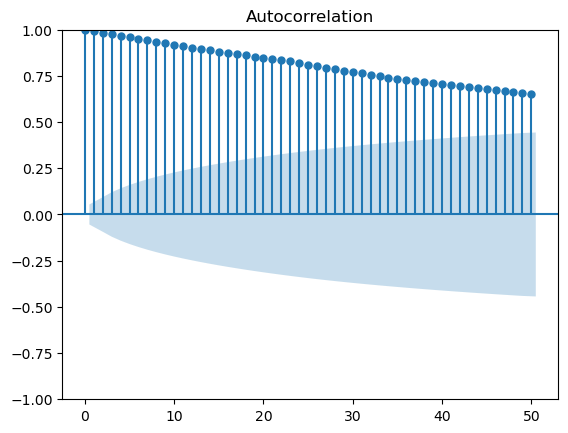

In [451]:
plot_acf(fintech['close_RGSS_RU'], lags=50)
plt.show

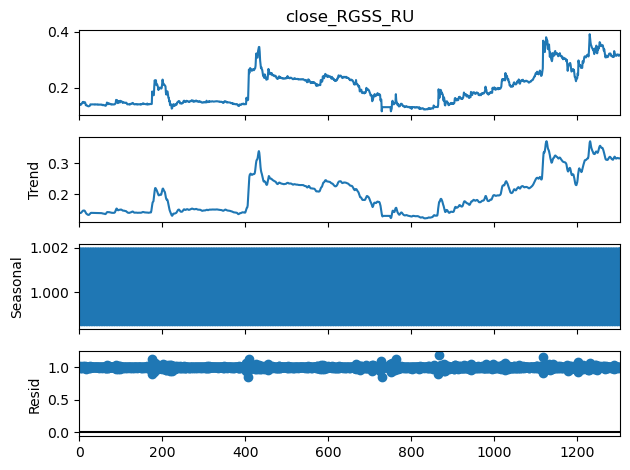

In [452]:
result = seasonal_decompose(fintech['close_RGSS_RU'], model='multiplicative', period=4)
result.plot()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

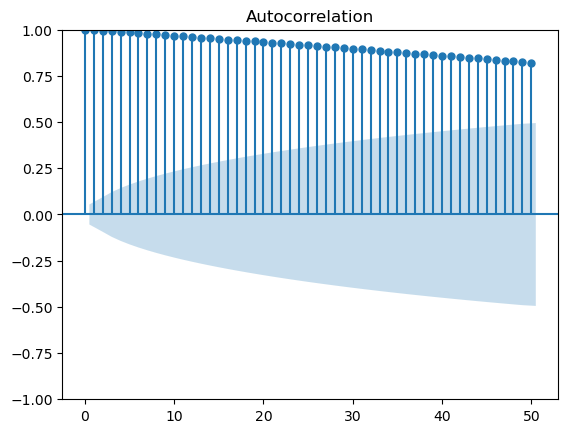

In [453]:
plot_acf(fintech['close_VTBR_RU'], lags=50)
plt.show

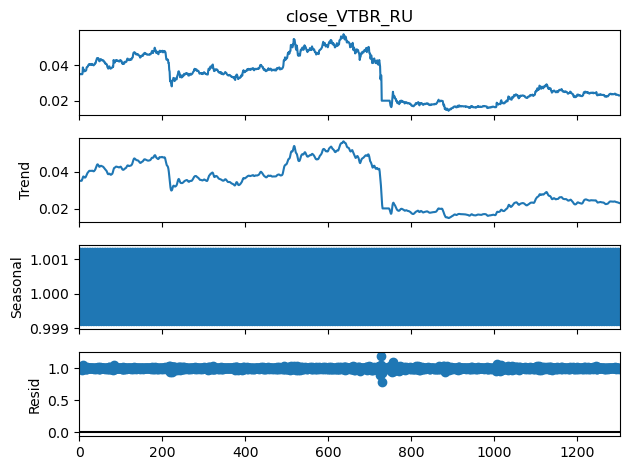

In [454]:
result = seasonal_decompose(fintech['close_VTBR_RU'], model='multiplicative', period=4)
result.plot()
plt.show()

**Вывод:** Нигде нет сезонности.

## Renewable energy (exponential smoothing)

In [456]:
re_exp_smoothing = ru_ticker_names_close_re + usa_ticker_names_close_re

In [457]:
# выбрал seasonal_periods=4, так как у него exp_smoothing_1.aic и .bic меньше, чем у seasonal_periods=12

re_seasonality_score = 0
for col in renewable_energy[re_exp_smoothing]:
    re_exp_smoothing_with_seasonality = ExponentialSmoothing(
        renewable_energy[col],
        seasonal_periods=4,
        trend="mul",
        seasonal="add",
        use_boxcox=True,
        initialization_method="estimated").fit()
    fitted_values_with_seasonality = re_exp_smoothing_with_seasonality.fittedvalues
    
    re_exp_smoothing_without_seasonality = ExponentialSmoothing(
        renewable_energy[col], 
        trend="mul", 
        seasonal=None,
        use_boxcox=True, 
        initialization_method="estimated").fit()
    fitted_values_without_seasonality = re_exp_smoothing_without_seasonality.fittedvalues
    
    if (re_exp_smoothing_with_seasonality.aic + re_exp_smoothing_with_seasonality.bic) < (re_exp_smoothing_without_seasonality.aic + re_exp_smoothing_without_seasonality.bic):
        re_seasonality_score += 1
        print(col)
        
print(re_seasonality_score / len(re_exp_smoothing))

close_HYDR_RU
0.03333333333333333


## Воспользуемся автокорреляционной функцией

<function matplotlib.pyplot.show(close=None, block=None)>

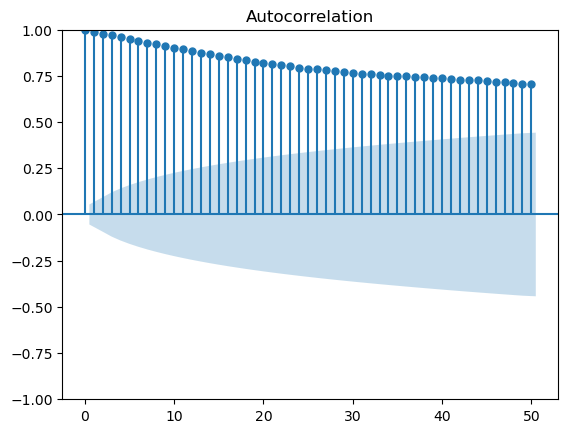

In [459]:
plot_acf(renewable_energy['close_HYDR_RU'], lags=50)
plt.show

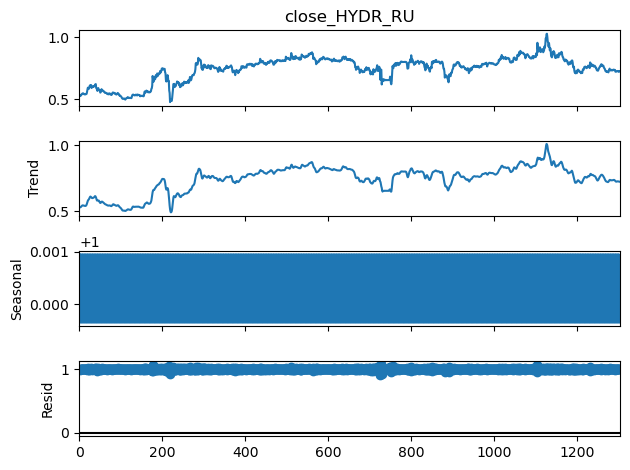

In [460]:
result = seasonal_decompose(renewable_energy['close_HYDR_RU'], model='multiplicative', period=4)
result.plot()
plt.show()

**Вывод:** Нигде нет сезонности.

## Industrial goods (exponential smoothing)

In [467]:
ig_exp_smoothing = ru_ticker_names_close_ig + usa_ticker_names_close_ig

In [473]:
for col in industrial_goods[ig_exp_smoothing]:
    if industrial_goods[col].all() <=0:
        print(col)

close_NKSH_RU


In [471]:
# выбрал seasonal_periods=4, так как у него exp_smoothing_1.aic и .bic меньше, чем у seasonal_periods=12

ig_seasonality_score = 0
for col in industrial_goods[ig_exp_smoothing]:
    ig_exp_smoothing_with_seasonality = ExponentialSmoothing(
        industrial_goods[col],
        seasonal_periods=4,
        trend="add",
        seasonal="add",
        use_boxcox=True,
        initialization_method="estimated").fit()
    fitted_values_with_seasonality = ig_exp_smoothing_with_seasonality.fittedvalues
    
    ig_exp_smoothing_without_seasonality = ExponentialSmoothing(
        industrial_goods[col], 
        trend="add", 
        seasonal=None,
        use_boxcox=True, 
        initialization_method="estimated").fit()
    fitted_values_without_seasonality = ig_exp_smoothing_without_seasonality.fittedvalues
    
    if (ig_exp_smoothing_with_seasonality.aic + ig_exp_smoothing_with_seasonality.bic) < (ig_exp_smoothing_without_seasonality.aic + ig_exp_smoothing_without_seasonality.bic):
        ig_seasonality_score += 1
        print(col)
        
print(ig_seasonality_score / len(ig_exp_smoothing))

ValueError: Data must be positive.

## Healthcare services (exponential smoothing)
hs = healthcare services

In [474]:
hs_exp_smoothing = ru_ticker_names_close_hs + usa_ticker_names_close_hs

In [475]:
for col in healthcare_services[hs_exp_smoothing]:
    if healthcare_services[col].all() <=0:
        print(col)

In [476]:
# выбрал seasonal_periods=4, так как у него exp_smoothing_1.aic и .bic меньше, чем у seasonal_periods=12

hs_seasonality_score = 0
for col in healthcare_services[hs_exp_smoothing]:
    hs_exp_smoothing_with_seasonality = ExponentialSmoothing(
        healthcare_services[col],
        seasonal_periods=4,
        trend="add",
        seasonal="add",
        use_boxcox=True,
        initialization_method="estimated").fit()
    fitted_values_with_seasonality = hs_exp_smoothing_with_seasonality.fittedvalues
    
    hs_exp_smoothing_without_seasonality = ExponentialSmoothing(
        healthcare_services[col], 
        trend="add", 
        seasonal=None,
        use_boxcox=True, 
        initialization_method="estimated").fit()
    fitted_values_without_seasonality = hs_exp_smoothing_without_seasonality.fittedvalues
    
    if (hs_exp_smoothing_with_seasonality.aic + hs_exp_smoothing_with_seasonality.bic) < (hs_exp_smoothing_without_seasonality.aic + hs_exp_smoothing_without_seasonality.bic):
        hs_seasonality_score += 1
        print(col)
        
print(hs_seasonality_score / len(hs_exp_smoothing))

0.0


**Вывод:** Нигде нет сезонности.

# Исследование корреляции индексов IMOEX и S&P500 с ценами акций 

## Fintech

* ### Случай российских компаний

In [517]:
indexes_shares_fintech = ru_ticker_names_close_fintech + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']

Для начала надо оценить общую картину. Выведем `PairGrid`, чтобы не перебирать все возможные комбинации и посмотрим, достойна ли какая-то пара показателей более тщательного исследования.

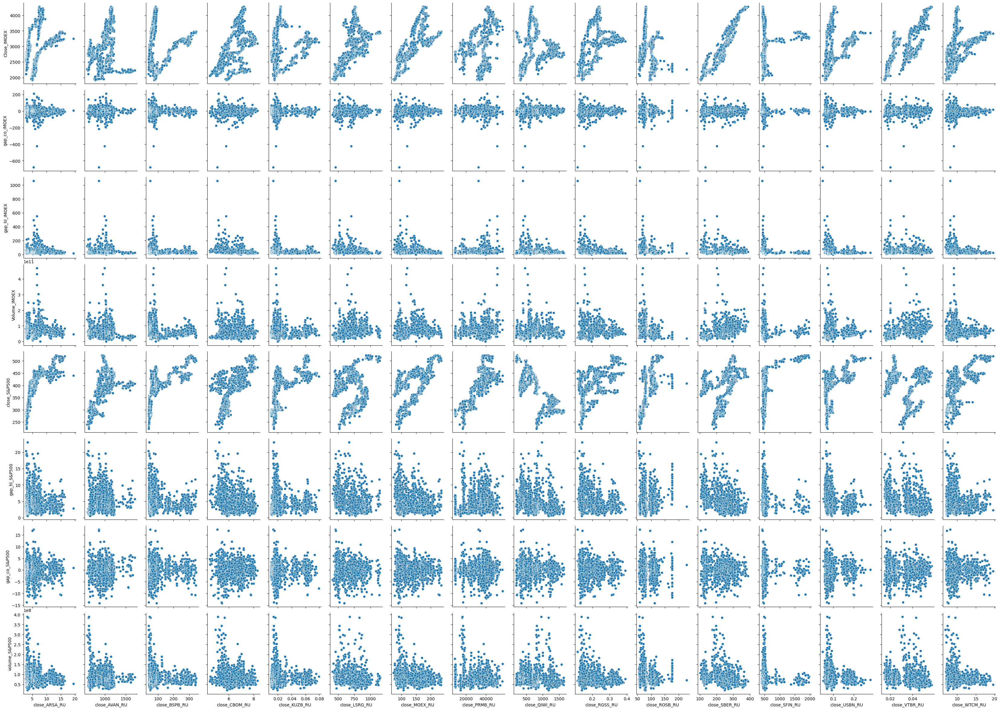

In [518]:
scatters = sns.PairGrid(fintech[indexes_shares_fintech], y_vars=['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500'], 
                        x_vars=ru_ticker_names_close_fintech, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

**Вывод:** к сожалению, хоть сколько-то интерпретируемые зависимости получились только у цен акций российских компаний с показателями `Close_IMOEX` и `close_S&P500`.

* ### Случай американских компаний

`PairGrid` для 89 оставшихся американских акций - слишком нечитабельно и долго. Поэтому мы решили, что 20 случайных акций будет вполне репрезентативной оценкой сектора финтех. Также рассмотрим сначала, есть ли что-то интересное.

In [260]:
random.seed(5)
random_usa_ticker_names = random.sample(usa_ticker_names_close, 20)
indexes_shares_fintech = random_usa_ticker_names + ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']

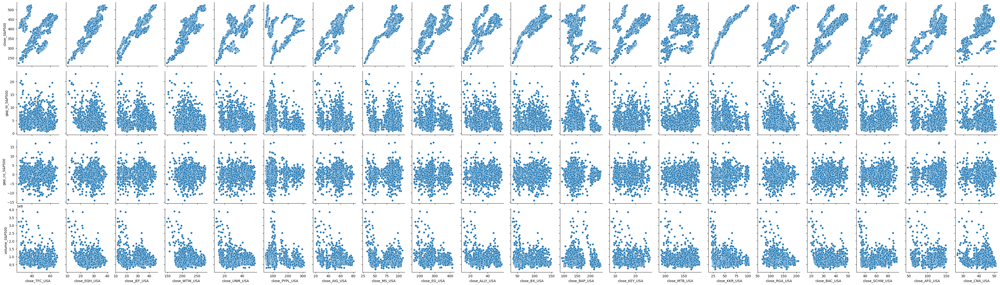

In [262]:
scatters = sns.PairGrid(fintech[indexes_shares_fintech], y_vars=['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500'], 
                        x_vars=random_usa_ticker_names, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

**Вывод:** идея с гэпами провалилась. единственная польза видна от признака `S&P500_close`. Это достойно более пристального внимания и применения `regplot`.

* ### Рассмотрим признак `close_S&P500`

In [287]:
random.seed(21)
display(random.sample(usa_ticker_names_close, 3))
display(random.sample(ru_ticker_names_close, 3))

['close_CBOE_USA', 'close_MCO_USA', 'close_WTW_USA']

['close_USBN_RU', 'close_ROSB_RU', 'close_KUZB_RU']

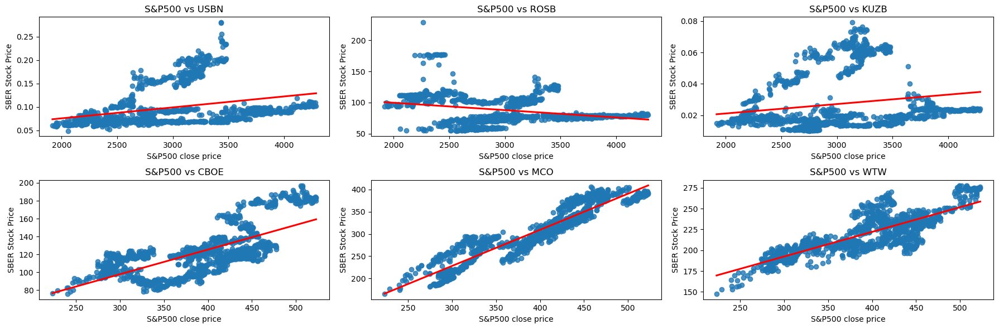

In [286]:
fig, axes = plt.subplots(2, 3, figsize=(18, 6))

sns.regplot(x='close_S&P500', y='close_USBN_RU', data=fintech, ax=axes[0, 0], ci=None, line_kws={'color': 'red'})
axes[0, 0].set_title('S&P500 vs USBN')
axes[0, 0].set_xlabel('S&P500 close price')
axes[0, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_ROSB_RU', data=fintech, ax=axes[0, 1], ci=None, line_kws={'color': 'red'})
axes[0, 1].set_title('S&P500 vs ROSB')
axes[0, 1].set_xlabel('S&P500 close price')
axes[0, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_KUZB_RU', data=fintech, ax=axes[0, 2], ci=None, line_kws={'color': 'red'})
axes[0, 2].set_title('S&P500 vs KUZB')
axes[0, 2].set_xlabel('S&P500 close price')
axes[0, 2].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_CBOE_USA', data=fintech, ax=axes[1, 0], ci=None, line_kws={'color': 'red'})
axes[1, 0].set_title('S&P500 vs CBOE')
axes[1, 0].set_xlabel('S&P500 close price')
axes[1, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_MCO_USA', data=fintech, ax=axes[1, 1], ci=None, line_kws={'color': 'red'})
axes[1, 1].set_title('S&P500 vs MCO')
axes[1, 1].set_xlabel('S&P500 close price')
axes[1, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_WTW_USA', data=fintech, ax=axes[1, 2], ci=None, line_kws={'color': 'red'})
axes[1, 2].set_title('S&P500 vs WTW')
axes[1, 2].set_xlabel('S&P500 close price')
axes[1, 2].set_ylabel('SBER Stock Price')


plt.tight_layout()
plt.show()

**Вывод:** не знаю пока, что писать...

* ### Рассмотрим признак `Close_IMOEX`

In [291]:
random.seed(1)
random.sample(ru_ticker_names_close, 6)

['close_KUZB_RU',
 'close_RGSS_RU',
 'close_USBN_RU',
 'close_SFIN_RU',
 'close_AVAN_RU',
 'close_WTCM_RU']

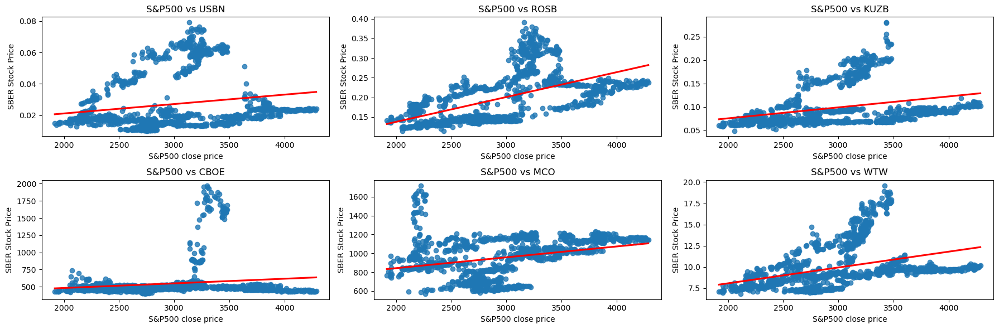

In [290]:
fig, axes = plt.subplots(2, 3, figsize=(18, 6))

sns.regplot(x='Close_IMOEX', y='close_KUZB_RU', data=fintech, ax=axes[0, 0], ci=None, line_kws={'color': 'red'})
axes[0, 0].set_title('S&P500 vs USBN')
axes[0, 0].set_xlabel('S&P500 close price')
axes[0, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_RGSS_RU', data=fintech, ax=axes[0, 1], ci=None, line_kws={'color': 'red'})
axes[0, 1].set_title('S&P500 vs ROSB')
axes[0, 1].set_xlabel('S&P500 close price')
axes[0, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_USBN_RU', data=fintech, ax=axes[0, 2], ci=None, line_kws={'color': 'red'})
axes[0, 2].set_title('S&P500 vs KUZB')
axes[0, 2].set_xlabel('S&P500 close price')
axes[0, 2].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_SFIN_RU', data=fintech, ax=axes[1, 0], ci=None, line_kws={'color': 'red'})
axes[1, 0].set_title('S&P500 vs CBOE')
axes[1, 0].set_xlabel('S&P500 close price')
axes[1, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_AVAN_RU', data=fintech, ax=axes[1, 1], ci=None, line_kws={'color': 'red'})
axes[1, 1].set_title('S&P500 vs MCO')
axes[1, 1].set_xlabel('S&P500 close price')
axes[1, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_WTCM_RU', data=fintech, ax=axes[1, 2], ci=None, line_kws={'color': 'red'})
axes[1, 2].set_title('S&P500 vs WTW')
axes[1, 2].set_xlabel('S&P500 close price')
axes[1, 2].set_ylabel('SBER Stock Price')


plt.tight_layout()
plt.show()

**Вывод:** не знаю пока, что писать...

# Корреляционная матрица между индексами и ценами акций.

## Fintech

Для 5 случайных акций американских компаний

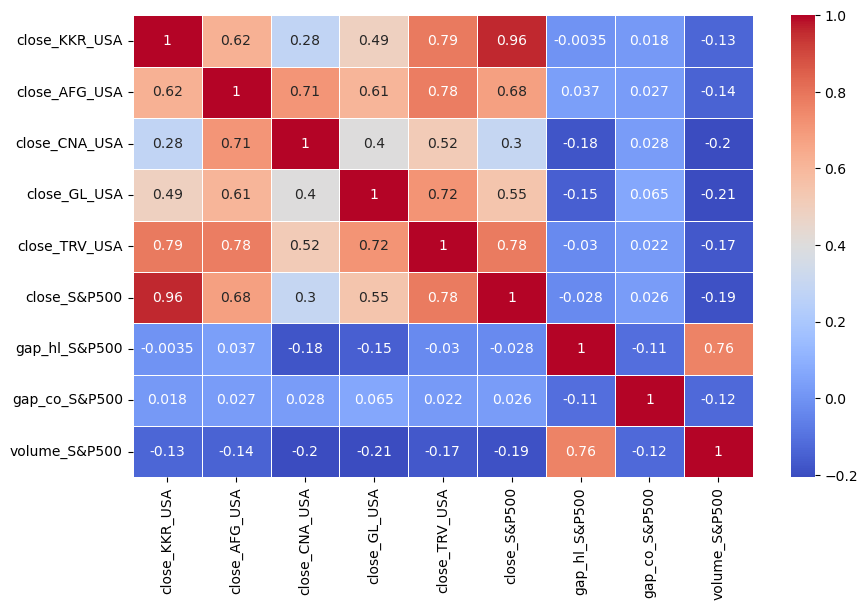

In [174]:
random.seed(25)
USA_price_samples_fintech = random.sample(usa_ticker_names_close_fintech, 5)
fintech_corr = fintech[USA_price_samples_fintech + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(fintech_corr, annot=True, cmap='coolwarm', linewidths=0.5);

Для 5 случайных акций российских компаний

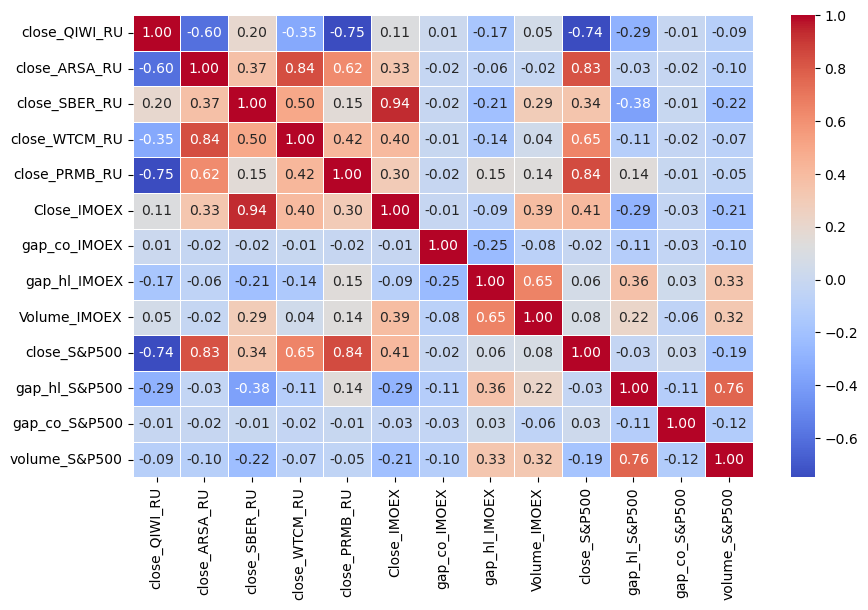

In [180]:
random.seed(52)
RU_price_samples_fintech = random.sample(ru_ticker_names_close_fintech, 5)
fintech_corr = fintech[RU_price_samples_fintech + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(fintech_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Вывод:** и тут снова подтверждается важность и влияние признака `close_S&P500`. Также интересна корреляция между акциями разных компаний. НАДО ЛИ ЧТО-ТО ПО ЭТОМУ ПОВОДУ ИССЛЕДОВАТЬ?!?!

## Industrial goods

Для 5 случайных акций американских компаний

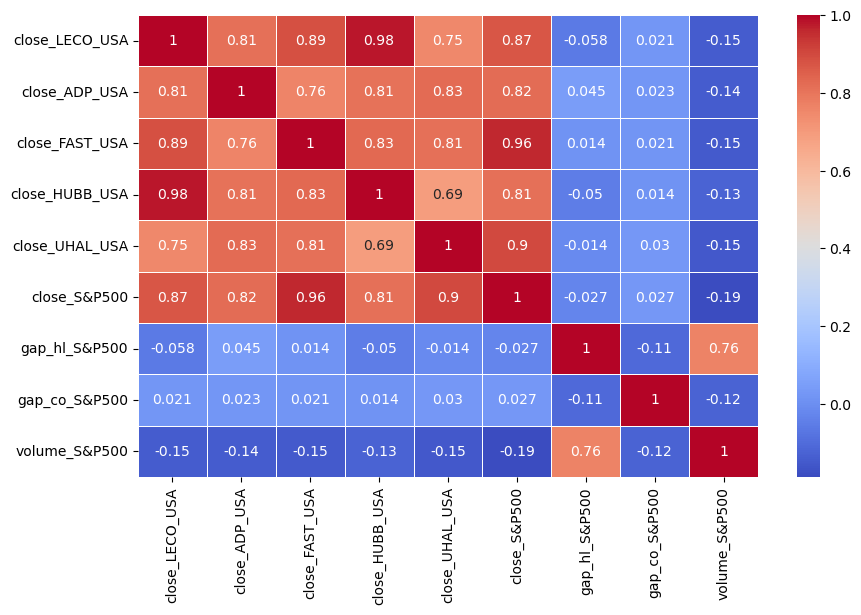

In [481]:
random.seed(25)
USA_price_samples_ig = random.sample(usa_ticker_names_close_ig, 5)
ig_corr = industrial_goods[USA_price_samples_ig + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(ig_corr, annot=True, cmap='coolwarm', linewidths=0.5);

Для 5 случайных акций российских компаний

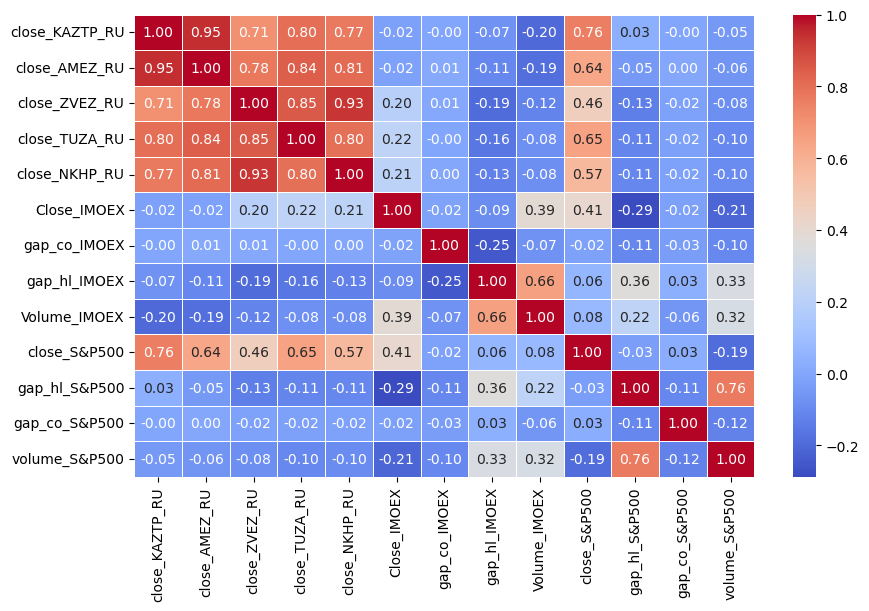

In [482]:
random.seed(52)
RU_price_samples_ig = random.sample(ru_ticker_names_close_ig, 5)
ig_corr = industrial_goods[RU_price_samples_ig + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(ig_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Вывод:** и тут снова подтверждается важность и влияние признака `close_S&P500`. Также интересна корреляция между акциями разных компаний. НАДО ЛИ ЧТО-ТО ПО ЭТОМУ ПОВОДУ ИССЛЕДОВАТЬ?!?!

## Renewable energy

Для 5 случайных акций американских компаний

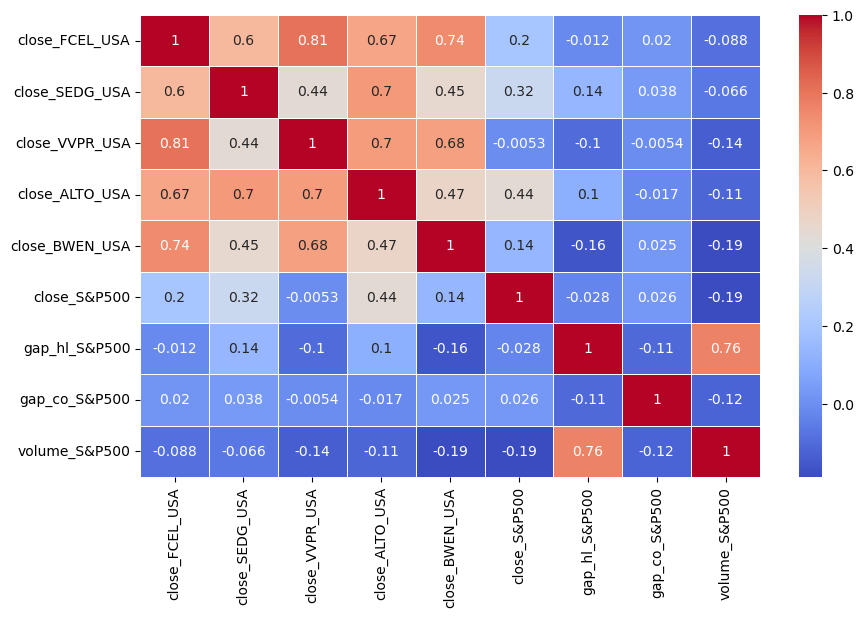

In [483]:
random.seed(25)
USA_price_samples_re = random.sample(usa_ticker_names_close_re, 5)
re_corr = renewable_energy[USA_price_samples_re + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(re_corr, annot=True, cmap='coolwarm', linewidths=0.5);

Для 5 случайных акций российских компаний

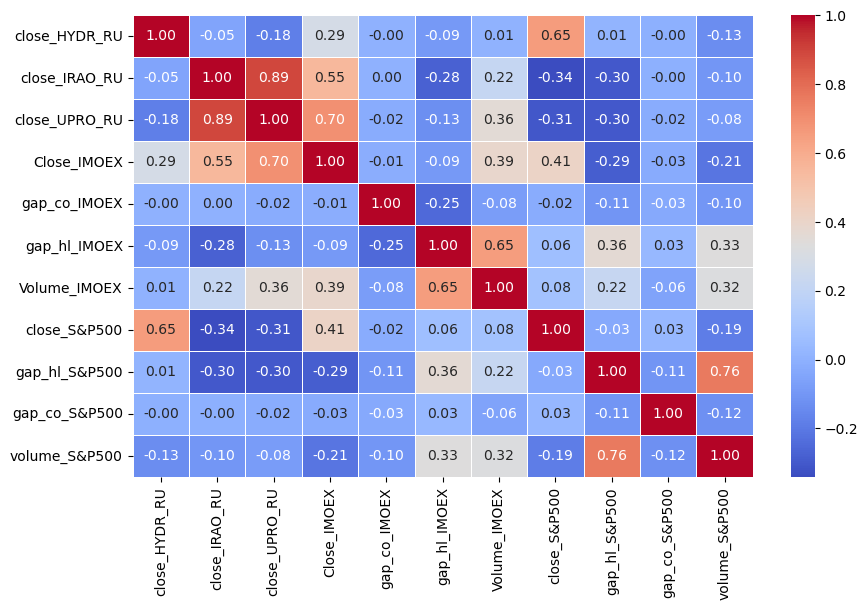

In [485]:
random.seed(52)
re_corr = renewable_energy[ru_ticker_names_close_re + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(re_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Вывод:** и тут снова подтверждается важность и влияние признака `close_S&P500`. Также интересна корреляция между акциями разных компаний. НАДО ЛИ ЧТО-ТО ПО ЭТОМУ ПОВОДУ ИССЛЕДОВАТЬ?!?!

## Healthcare services

Для 5 случайных акций американских компаний

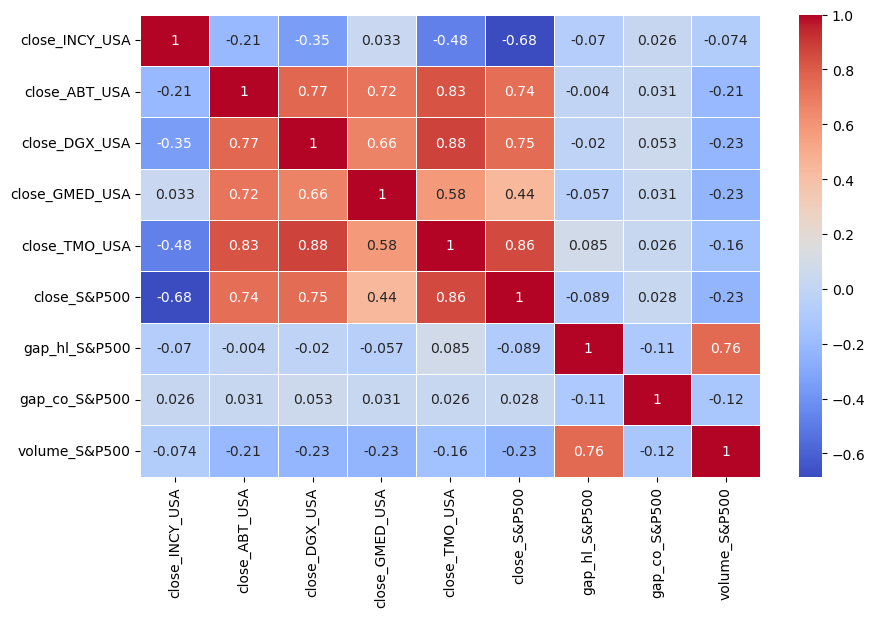

In [486]:
random.seed(25)
USA_price_samples_hs = random.sample(usa_ticker_names_close_hs, 5)
hs_corr = healthcare_services[USA_price_samples_hs + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(hs_corr, annot=True, cmap='coolwarm', linewidths=0.5);

Для 5 случайных акций российских компаний

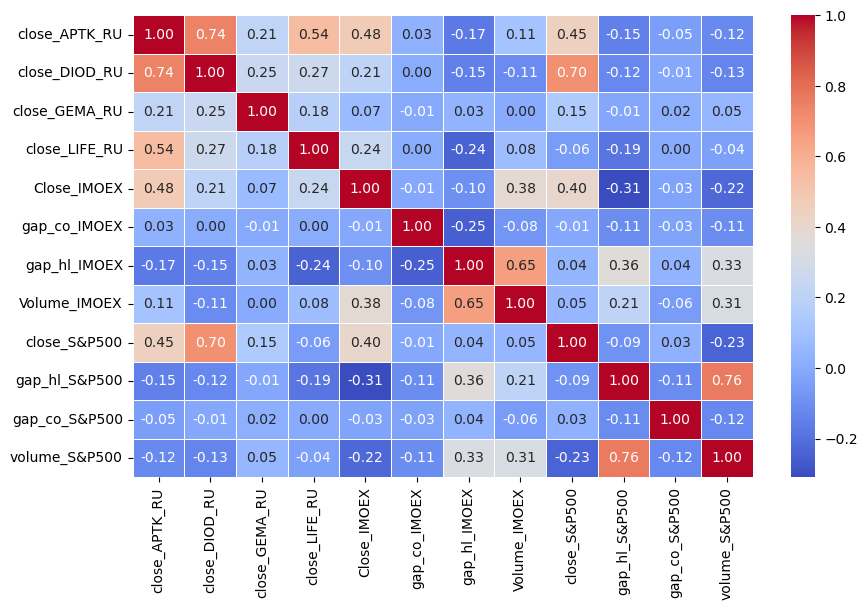

In [488]:
random.seed(52)
hs_corr = healthcare_services[ru_ticker_names_close_hs + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(hs_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Вывод:** и тут снова подтверждается важность и влияние признака `close_S&P500`. Также интересна корреляция между акциями разных компаний. НАДО ЛИ ЧТО-ТО ПО ЭТОМУ ПОВОДУ ИССЛЕДОВАТЬ?!?!

# Диаграммы рассеяния для `usdrub` и цен акций российских компаний.

## Fintech

Сначала посмотрим общую картину с помощью `PairGrid`. Потом конкретные пары рассмотрим подробнее, используя `scatterplot`.

In [489]:
usdrub_shares_fintech = ru_ticker_names_close_fintech + ['usdrub']

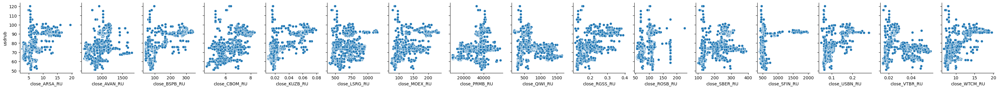

In [490]:
scatters = sns.PairGrid(fintech[usdrub_shares_fintech], y_vars=['usdrub'], x_vars=ru_ticker_names_close_fintech, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Единственные сколько-то интересные графики

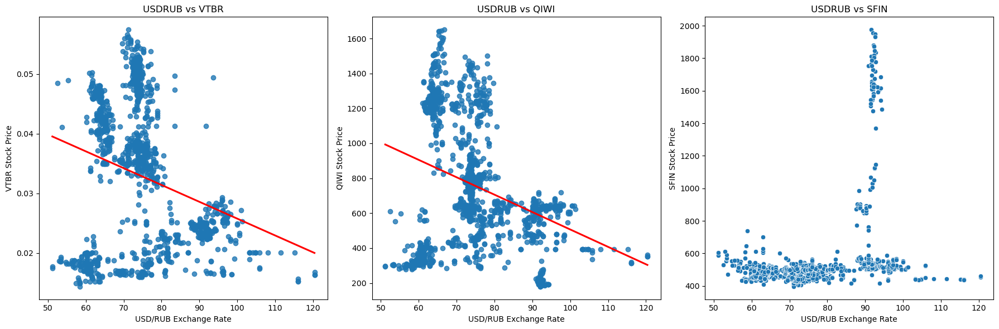

In [219]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.regplot(x='usdrub', y='close_VTBR_RU', data=fintech, ax=axes[0], ci=None, line_kws={'color': 'red'})
axes[0].set_title('USDRUB vs VTBR')
axes[0].set_xlabel('USD/RUB Exchange Rate')
axes[0].set_ylabel('VTBR Stock Price')

sns.regplot(x='usdrub', y='close_QIWI_RU', data=fintech, ax=axes[1], ci=None, line_kws={'color': 'red'})
axes[1].set_title('USDRUB vs QIWI')
axes[1].set_xlabel('USD/RUB Exchange Rate')
axes[1].set_ylabel('QIWI Stock Price')

sns.scatterplot(x='usdrub', y='close_SFIN_RU', data=fintech, ax=axes[2])
axes[2].set_title('USDRUB vs SFIN')
axes[2].set_xlabel('USD/RUB Exchange Rate')
axes[2].set_ylabel('SFIN Stock Price')

plt.tight_layout()
plt.show()

В случае первых двух акций мы видим отрицательный наклон у линии тренда, что кажется интересным наблюдением, однако точки на графике рассеяния настолько беспорядочно разбросаны, что не позволяет делать нам какие-либо выводы. Третий график мы решили оставить для того, что сформировать новый признак. Но если взглянуть на график акций компании `SFIN_RU`, то можно понять, что он ничего особенного из него не вытащить.

## Industrial goods

Сначала посмотрим общую картину с помощью `PairGrid`. Потом конкретные пары рассмотрим подробнее, используя `scatterplot`.

In [493]:
usdrub_shares_ig = ru_ticker_names_close_ig + ['usdrub']

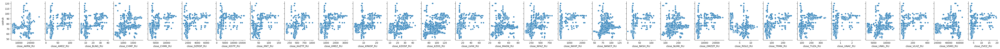

In [494]:
scatters = sns.PairGrid(industrial_goods[usdrub_shares_ig], y_vars=['usdrub'], x_vars=ru_ticker_names_close_ig, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Единственные сколько-то интересные графики

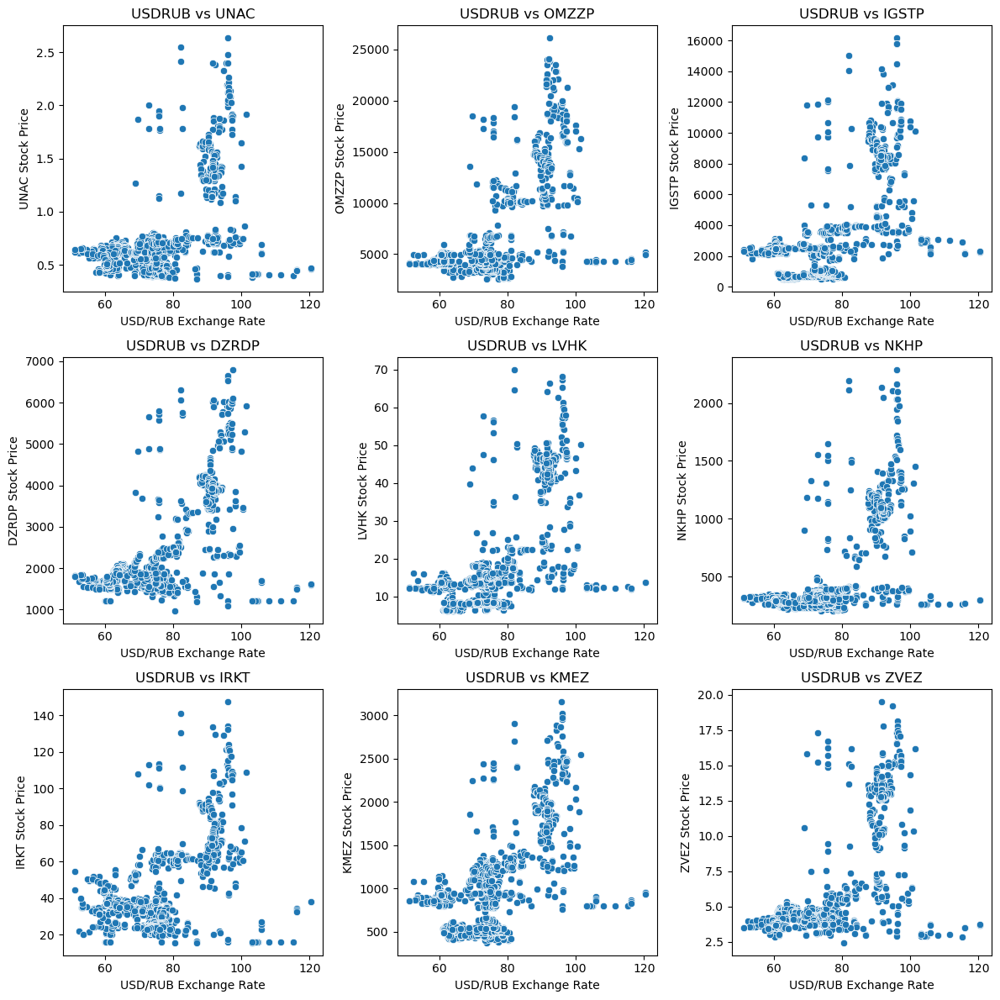

In [500]:
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

sns.scatterplot(x='usdrub', y='close_UNAC_RU', data=industrial_goods, ax=axes[0, 0])
axes[0, 0].set_title('USDRUB vs UNAC')
axes[0, 0].set_xlabel('USD/RUB Exchange Rate')
axes[0, 0].set_ylabel('UNAC Stock Price')

sns.scatterplot(x='usdrub', y='close_OMZZP_RU', data=industrial_goods, ax=axes[0, 1])
axes[0, 1].set_title('USDRUB vs OMZZP')
axes[0, 1].set_xlabel('USD/RUB Exchange Rate')
axes[0, 1].set_ylabel('OMZZP Stock Price')

sns.scatterplot(x='usdrub', y='close_IGSTP_RU', data=industrial_goods, ax=axes[0, 2])
axes[0, 2].set_title('USDRUB vs IGSTP')
axes[0, 2].set_xlabel('USD/RUB Exchange Rate')
axes[0, 2].set_ylabel('IGSTP Stock Price')

sns.scatterplot(x='usdrub', y='close_DZRDP_RU', data=industrial_goods, ax=axes[1, 0])
axes[1, 0].set_title('USDRUB vs DZRDP')
axes[1, 0].set_xlabel('USD/RUB Exchange Rate')
axes[1, 0].set_ylabel('DZRDP Stock Price')

sns.scatterplot(x='usdrub', y='close_LVHK_RU', data=industrial_goods, ax=axes[1, 1])
axes[1, 1].set_title('USDRUB vs LVHK')
axes[1, 1].set_xlabel('USD/RUB Exchange Rate')
axes[1, 1].set_ylabel('LVHK Stock Price')

sns.scatterplot(x='usdrub', y='close_NKHP_RU', data=industrial_goods, ax=axes[1, 2])
axes[1, 2].set_title('USDRUB vs NKHP')
axes[1, 2].set_xlabel('USD/RUB Exchange Rate')
axes[1, 2].set_ylabel('NKHP Stock Price')

sns.scatterplot(x='usdrub', y='close_IRKT_RU', data=industrial_goods, ax=axes[2, 0])
axes[2, 0].set_title('USDRUB vs IRKT')
axes[2, 0].set_xlabel('USD/RUB Exchange Rate')
axes[2, 0].set_ylabel('IRKT Stock Price')

sns.scatterplot(x='usdrub', y='close_KMEZ_RU', data=industrial_goods, ax=axes[2, 1])
axes[2, 1].set_title('USDRUB vs KMEZ')
axes[2, 1].set_xlabel('USD/RUB Exchange Rate')
axes[2, 1].set_ylabel('KMEZ Stock Price')

sns.scatterplot(x='usdrub', y='close_ZVEZ_RU', data=industrial_goods, ax=axes[2, 2])
axes[2, 2].set_title('USDRUB vs ZVEZ')
axes[2, 2].set_xlabel('USD/RUB Exchange Rate')
axes[2, 2].set_ylabel('ZVEZ Stock Price')

plt.tight_layout()
plt.show()

У этих акций нас заинтересовал рост цен в диапазоне курса от 90 до 100.

## Renewable energy

Сначала посмотрим общую картину с помощью `PairGrid`. Потом конкретные пары рассмотрим подробнее, используя `scatterplot`.

In [502]:
usdrub_shares_re = ru_ticker_names_close_re + ['usdrub']

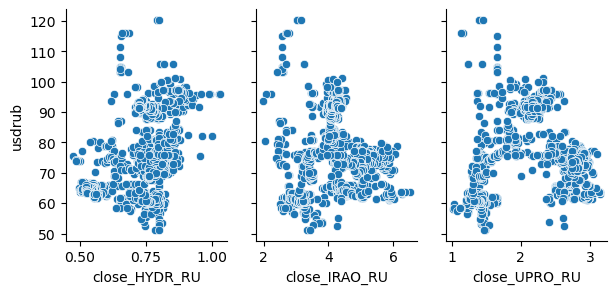

In [503]:
scatters = sns.PairGrid(renewable_energy[usdrub_shares_re], y_vars=['usdrub'], x_vars=ru_ticker_names_close_re, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Никаких инетерсных наблюдений.

## Healthcare services

Сначала посмотрим общую картину с помощью `PairGrid`. Потом конкретные пары рассмотрим подробнее, используя `scatterplot`.

In [505]:
usdrub_shares_hs = ru_ticker_names_close_hs + ['usdrub']

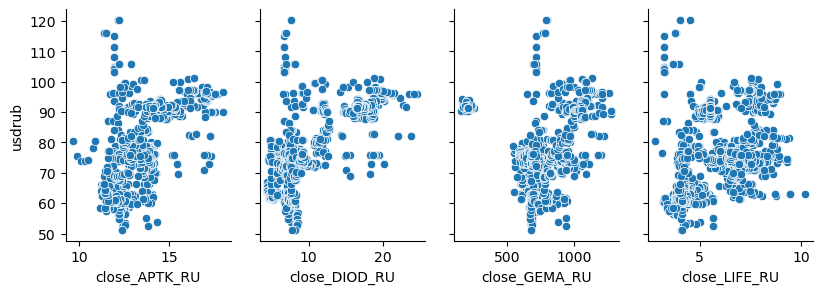

In [507]:
scatters = sns.PairGrid(healthcare_services[usdrub_shares_hs], y_vars=['usdrub'], x_vars=ru_ticker_names_close_hs, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Nothing Interesting

Также важно понимать, насколько **сильно связаны курс `USD/RUB` с ценами на драг металлы**. Поэтому смысла выводить диаграммы рассеяния для цен на драг металлы и цен акций российских компаний нет. Остановимся только на американских компаниях.

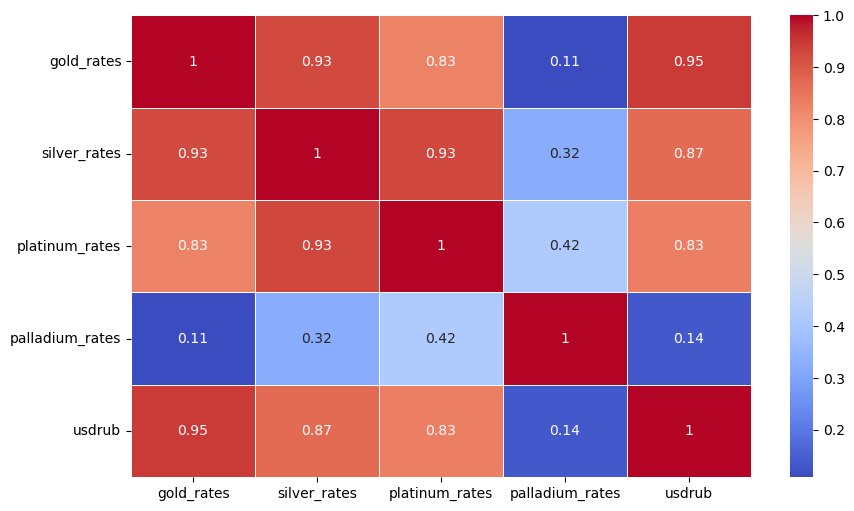

In [245]:
precious_usdrub_corr = fintech[['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates', 'usdrub']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(precious_usdrub_corr, annot=True, cmap='coolwarm', linewidths=0.5);

Как оказалось, `Palladium` особо **не коррелирует** с курсом USD/RUB и ценами других драг металлов. Интересно, запомним это.

# Анализ зависимостей цен на драг металлы с ценами акций

Перейдем к следующей группе признаков: цены на драгоценные металлы. Исследуем их через диаграммы рессеяния

## Fintech

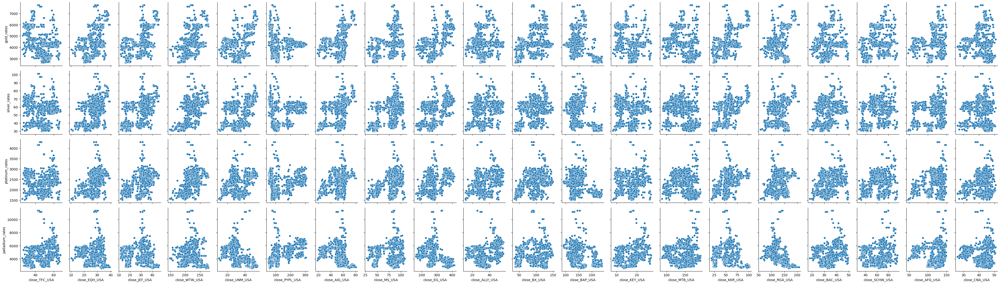

In [510]:
random.seed(5)
random_usa_ticker_names_fintech = random.sample(usa_ticker_names_close_fintech, 20)
precious_metals_fintech_shares = random_usa_ticker_names_fintech + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(fintech[precious_metals_fintech_shares], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_fintech, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Тоже ничего достойного более подробного рассмотрения...

## Industrial goods

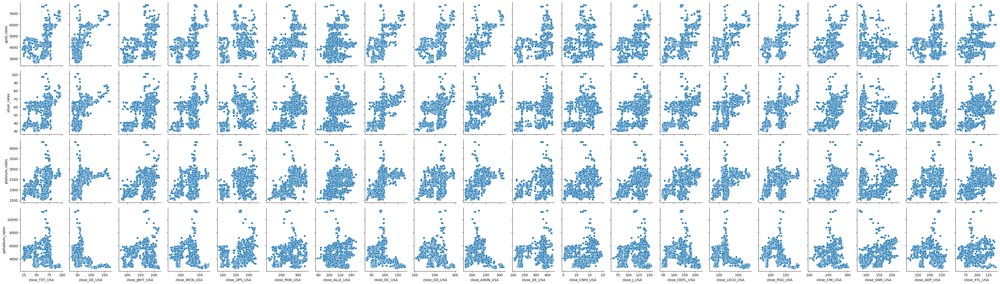

In [513]:
random.seed(5)
random_usa_ticker_names_ig = random.sample(usa_ticker_names_close_ig, 20)
precious_metals_shares_ig = random_usa_ticker_names_ig + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(industrial_goods[precious_metals_shares_ig], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_ig, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Тоже ничего достойного более подробного рассмотрения...

## Renewable energy

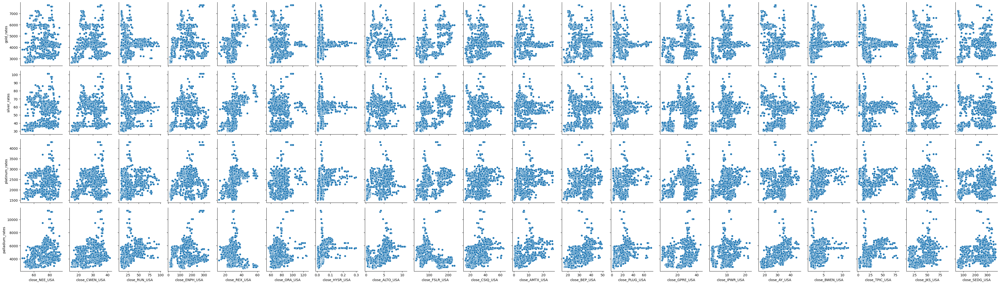

In [514]:
random.seed(5)
random_usa_ticker_names_re = random.sample(usa_ticker_names_close_re, 20)
precious_metals_re_shares = random_usa_ticker_names_re + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(renewable_energy[precious_metals_re_shares], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_re, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Тоже ничего достойного более подробного рассмотрения...

## Healthcare services

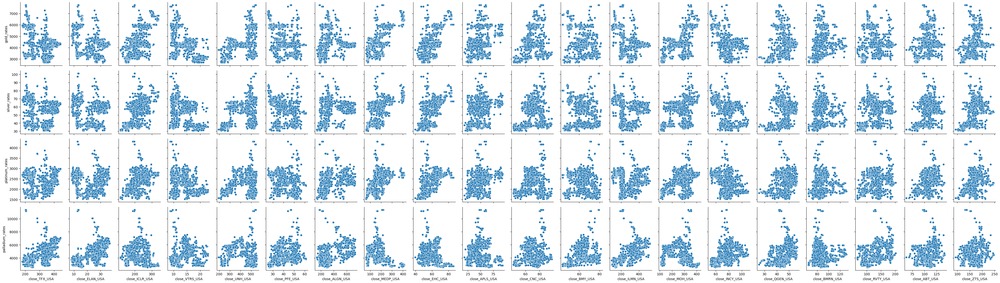

In [515]:
random.seed(5)
random_usa_ticker_names_hs = random.sample(usa_ticker_names_close_hs, 20)
precious_metals_hs_shares = random_usa_ticker_names_hs + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(healthcare_services[precious_metals_hs_shares], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_hs, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Тоже ничего достойного более подробного рассмотрения...

## Распределения курсов драг металлов
зачем?!?!

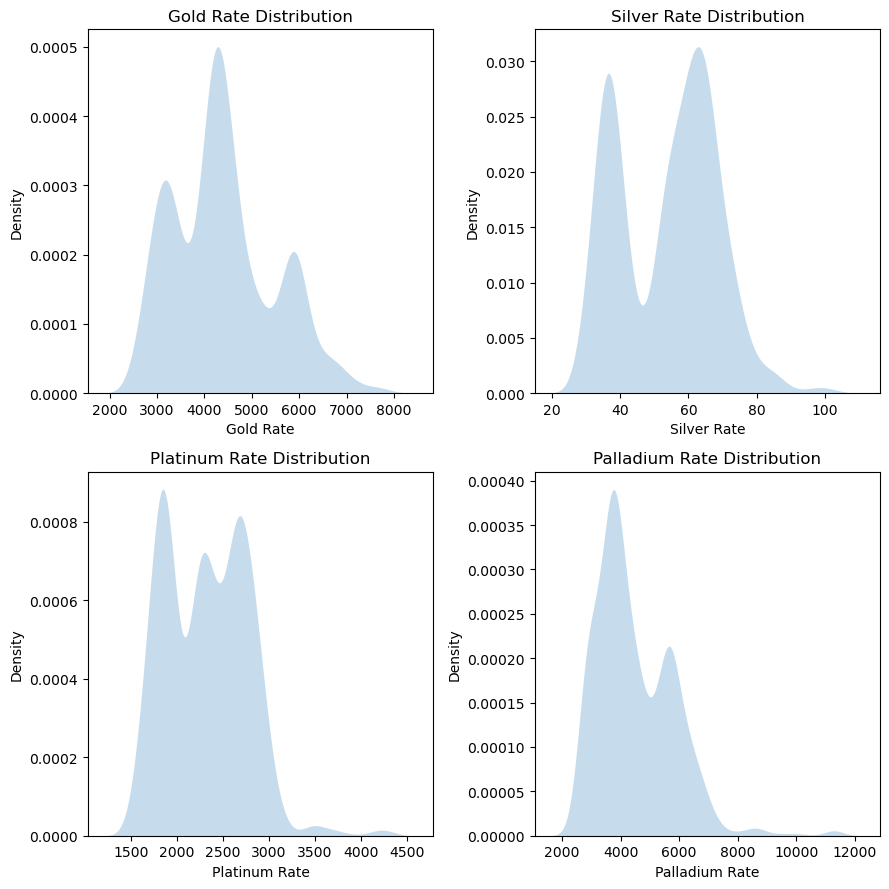

In [257]:
fig, axes = plt.subplots(2, 2, figsize=(9, 9))

sns.kdeplot(data=fintech, x='gold_rates', ax=axes[0, 0], fill=True, linewidth=0)
axes[0, 0].set_title('Gold Rate Distribution')
axes[0, 0].set_xlabel('Gold Rate')

sns.kdeplot(data=fintech, x='silver_rates', ax=axes[0, 1], fill=True, linewidth=0)
axes[0, 1].set_title('Silver Rate Distribution')
axes[0, 1].set_xlabel('Silver Rate')

sns.kdeplot(data=fintech, x='platinum_rates', ax=axes[1, 0], fill=True, linewidth=0)
axes[1, 0].set_title('Platinum Rate Distribution')
axes[1, 0].set_xlabel('Platinum Rate')

sns.kdeplot(data=fintech, x='palladium_rates', ax=axes[1, 1], fill=True, linewidth=0)
axes[1, 1].set_title('Palladium Rate Distribution')
axes[1, 1].set_xlabel('Palladium Rate')

plt.tight_layout()
plt.show()

**Вывод:** пока ничего не придумал

## Гистограммы для дневных изменений цен акций
зачем?!?!?

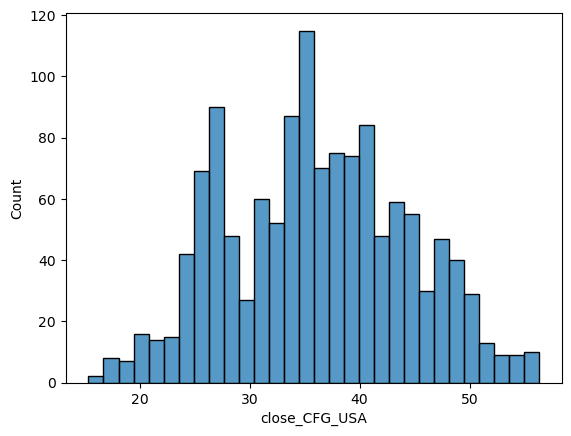

In [313]:
sns.histplot(data=fintech, x='close_CFG_USA', bins=30);

**На подумать:** возможно, есть инетерсный вывод, что у большинства акций ±всегда два видных пика. Хотя вряд ли это так